In [1]:
from ucimlrepo import fetch_ucirepo

In [2]:
# fetch dataset 
rice = fetch_ucirepo(id=545)

In [3]:
from logistic_regression import LogisticRegression
model = LogisticRegression(rice["data"]["original"])

## Feature distributions before normalization
We have rendered the distribution graphs of the features in the folder feature_graphs with high resolution. You can check them below or also render them by calling the plot_feature method of 'model'.

In [4]:
# model.plot_feature(0)
# model.plot_feature(1)
# model.plot_feature(2)
# model.plot_feature(3)
# model.plot_feature(4)
# model.plot_feature(5)
# model.plot_feature(6)

### Distribution of feature 0 (Area)
![Distribution of feature 0 (Area)](feature_graphs/feature0_distribution.png)
### Distribution of feature 1 (Perimeter)
![Distribution of feature 1 (Perimeter)](feature_graphs/feature1_distribution.png)
### Distribution of feature 2 (Major_Axis_Length)
![Distribution of feature 2 (Major_Axis_Length)](feature_graphs/feature2_distribution.png)
### Distribution of feature 3 (Minor_Axis_Length)
![Distribution of feature 3 (Minor_Axis_Length)](feature_graphs/feature3_distribution.png)
### Distribution of feature 4 (Eccentricity)
![Distribution of feature 4 (Eccentricity)](feature_graphs/feature4_distribution.png)
### Distribution of feature 5 (Convex_Area)
![Distribution of feature 5 (Convex_Area)](feature_graphs/feature5_distribution.png)
### Distribution of feature 6 (Extent)
![Distribution of feature 6 (Extent)](feature_graphs/feature6_distribution.png)

## Clipping
We decided to clip the outliers from 0th, 3rd, 4th, and 5th features (area, minor_axis_length, eccentricity, and convex_area).

In [5]:
model.clip_feature(0, 8459, 17663)
model.clip_feature(3, 67.7, 104)
model.clip_feature(4, 0.825, 0.935)
model.clip_feature(5, 8519, 17961)

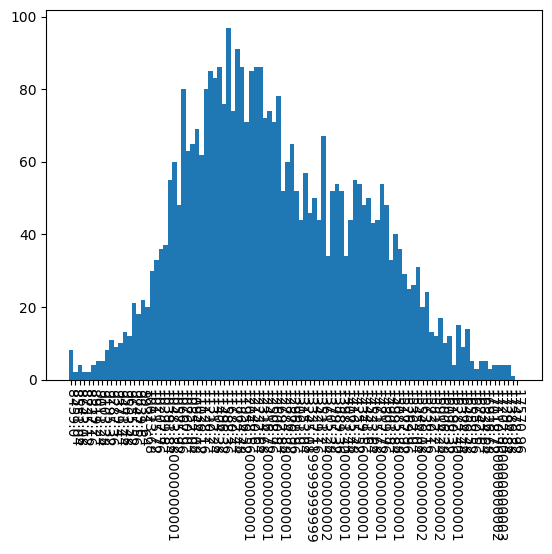

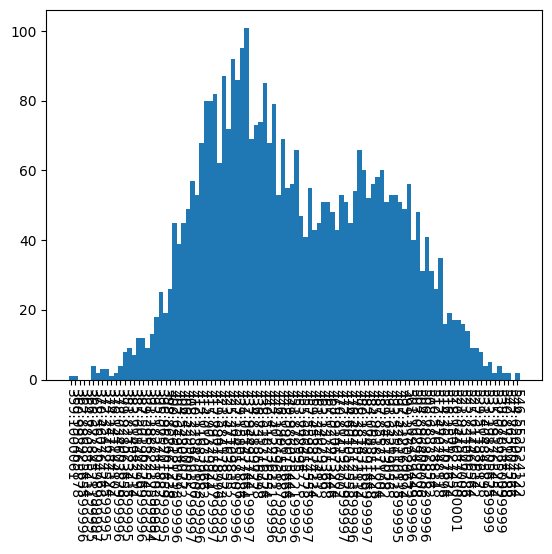

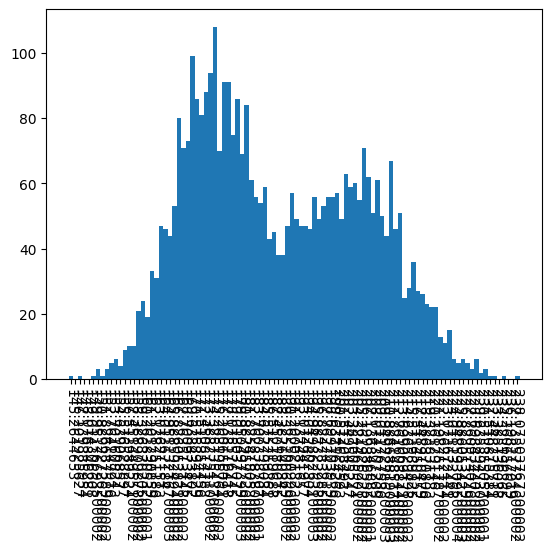

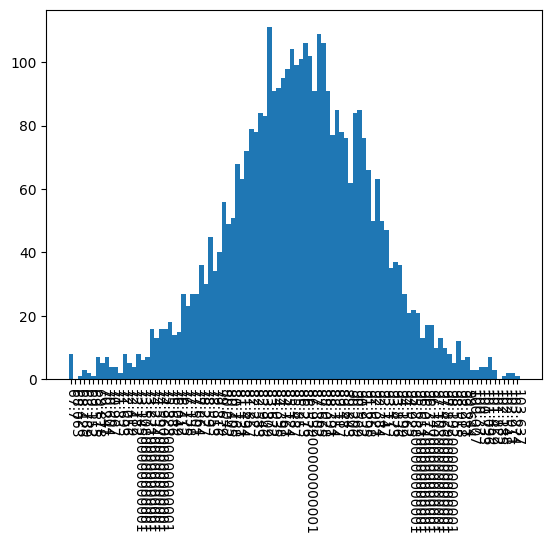

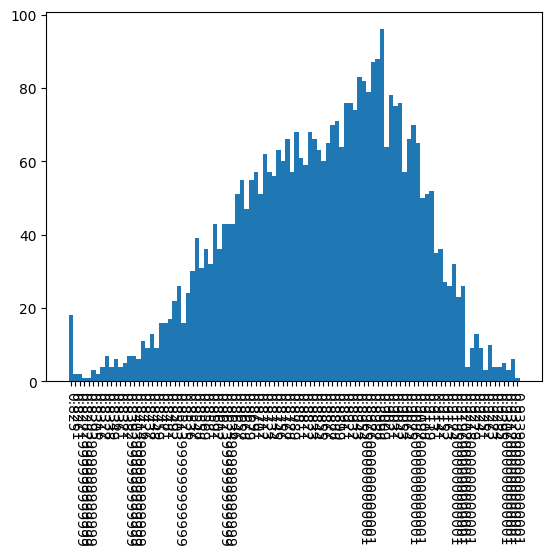

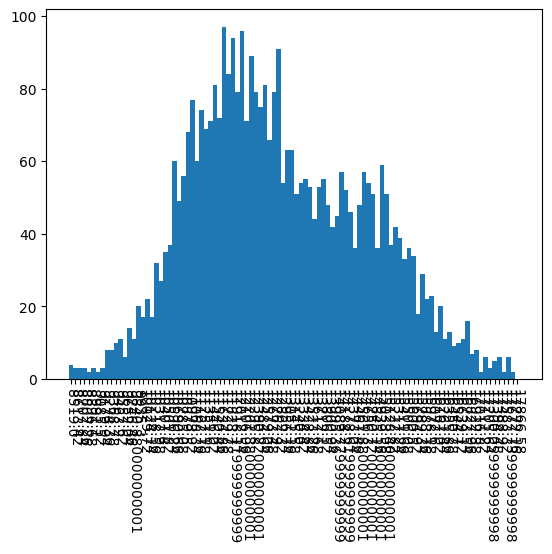

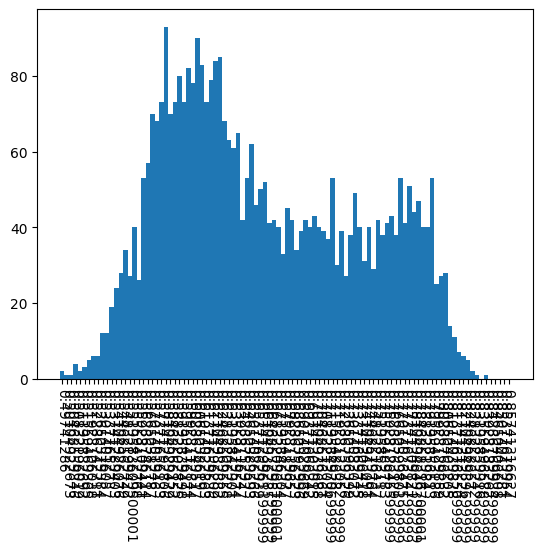

In [6]:
model.plot_feature(0)
model.plot_feature(1)
model.plot_feature(2)
model.plot_feature(3)
model.plot_feature(4)
model.plot_feature(5)
model.plot_feature(6)

## Scaling
Now, we will scale all features between 0 and 1.

In [7]:
model.scale_features()

## Data split

In [8]:
model.split_data(0.8)

## Training

Let's train now

In [9]:
from datetime import datetime

In [10]:
start = datetime.now()
model.GD(0.05, 45000)
non_reg_gd_losses = model.losses
end = datetime.now()
non_reg_gd_duration = (end-start).total_seconds()
print("Time elapsed in seconds: ", (end-start).total_seconds())

Iteration:  0
	Loss:  0.6936184637870797
	Training accuracy:  0.5662729658792651
	Test accuracy:  0.5958005249343832
Iteration:  1
	Loss:  0.6931121260249489
	Training accuracy:  0.5662729658792651
	Test accuracy:  0.5958005249343832
Iteration:  2
	Loss:  0.6926155078710992
	Training accuracy:  0.5662729658792651
	Test accuracy:  0.5958005249343832
Iteration:  3
	Loss:  0.6921281912714812
	Training accuracy:  0.5662729658792651
	Test accuracy:  0.5958005249343832
Iteration:  4
	Loss:  0.6916497768000414
	Training accuracy:  0.5662729658792651
	Test accuracy:  0.5958005249343832
Iteration:  5
	Loss:  0.6911798828474994
	Training accuracy:  0.6020341207349081
	Test accuracy:  0.6259842519685039
Iteration:  6
	Loss:  0.6907181448433126
	Training accuracy:  0.7358923884514436
	Test accuracy:  0.7650918635170604
Iteration:  7
	Loss:  0.6902642145096886
	Training accuracy:  0.7988845144356955
	Test accuracy:  0.8228346456692913
Iteration:  8
	Loss:  0.6898177591465209
	Training accuracy:  0.

In [11]:
start = datetime.now()
model.SGD(0.05, 60)
non_reg_sgd_losses = model.losses
end = datetime.now()
non_reg_sgd_duration = (end-start).total_seconds()
print("Time elapsed in seconds: ", (end-start).total_seconds())

Epoch:  0
	Loss:  0.4312676745418345
	Training accuracy:  0.8284120734908137
	Test accuracy:  0.8412073490813649
Epoch:  1
	Loss:  0.3711572555344005
	Training accuracy:  0.8612204724409449
	Test accuracy:  0.8713910761154856
Epoch:  2
	Loss:  0.3342757091161074
	Training accuracy:  0.8841863517060368
	Test accuracy:  0.8910761154855643
Epoch:  3
	Loss:  0.3084938640623832
	Training accuracy:  0.895997375328084
	Test accuracy:  0.9041994750656168
Epoch:  4
	Loss:  0.2895462411440739
	Training accuracy:  0.902230971128609
	Test accuracy:  0.9133858267716536
Epoch:  5
	Loss:  0.2751374288830665
	Training accuracy:  0.9081364829396326
	Test accuracy:  0.9212598425196851
Epoch:  6
	Loss:  0.2638772206883325
	Training accuracy:  0.9114173228346457
	Test accuracy:  0.926509186351706
Epoch:  7
	Loss:  0.2548768897445092
	Training accuracy:  0.9127296587926509
	Test accuracy:  0.926509186351706
Epoch:  8
	Loss:  0.24754586939260437
	Training accuracy:  0.9150262467191601
	Test accuracy:  0.929

## 5-fold Cross Validation for Finding Regularization Parameter

Gradient descent

In [12]:
gd_best_lambda, gd_mean_accuracies = model.find_best_lambda(5, [-3, -4, -5, -6], 0.05, 45000)

Stochastic Gradient Descent

In [13]:
sgd_best_lambda, sgd_mean_accuracies = model.find_best_lambda(5, [-3, -4, -5, -6], 0.05, 60, is_stochastic=True)

In [14]:
gd_best_lambda, gd_mean_accuracies, sgd_best_lambda, sgd_mean_accuracies

(-4,
 [0.9150265148456217,
  0.9196215241325474,
  0.9189652480551294,
  0.9186368408301704],
 -5,
 [0.621064362432367,
  0.9232296966270963,
  0.9242138415569732,
  0.9242138415569732])

## Training with regularization

In [15]:
start = datetime.now()
model.GD(0.05, 45000, lambda_power=gd_best_lambda)
reg_gd_losses = model.losses
end = datetime.now()
reg_gd_duration = (end-start).total_seconds()
print("Time elapsed in seconds: ", (end-start).total_seconds())

Iteration:  0
	Loss:  0.6920194895414212
	Training accuracy:  0.43372703412073493
	Test accuracy:  0.4041994750656168
Iteration:  1
	Loss:  0.6915956599780704
	Training accuracy:  0.4340551181102362
	Test accuracy:  0.4041994750656168
Iteration:  2
	Loss:  0.6911778057965908
	Training accuracy:  0.4343832020997375
	Test accuracy:  0.4041994750656168
Iteration:  3
	Loss:  0.6907656769296495
	Training accuracy:  0.4343832020997375
	Test accuracy:  0.4041994750656168
Iteration:  4
	Loss:  0.690359035443211
	Training accuracy:  0.4343832020997375
	Test accuracy:  0.40551181102362205
Iteration:  5
	Loss:  0.6899576533530783
	Training accuracy:  0.4343832020997375
	Test accuracy:  0.4068241469816273
Iteration:  6
	Loss:  0.6895613128617776
	Training accuracy:  0.4343832020997375
	Test accuracy:  0.4068241469816273
Iteration:  7
	Loss:  0.6891698058643855
	Training accuracy:  0.43471128608923887
	Test accuracy:  0.4068241469816273
Iteration:  8
	Loss:  0.6887829331866622
	Training accuracy:  

In [16]:
start = datetime.now()
model.SGD(0.05, 60, lambda_power=sgd_best_lambda)
reg_sgd_losses = model.losses
end = datetime.now()
reg_sgd_duration = (end-start).total_seconds()
print("Time elapsed in seconds: ", (end-start).total_seconds())

Epoch:  0
	Loss:  0.4315579190175497
	Training accuracy:  0.8284120734908137
	Test accuracy:  0.8412073490813649
Epoch:  1
	Loss:  0.3716219998888337
	Training accuracy:  0.8612204724409449
	Test accuracy:  0.8713910761154856
Epoch:  2
	Loss:  0.33493191360573965
	Training accuracy:  0.8841863517060368
	Test accuracy:  0.8910761154855643
Epoch:  3
	Loss:  0.30936242440354
	Training accuracy:  0.895997375328084
	Test accuracy:  0.9041994750656168
Epoch:  4
	Loss:  0.29063471330938556
	Training accuracy:  0.902230971128609
	Test accuracy:  0.9120734908136483
Epoch:  5
	Loss:  0.2764451822189292
	Training accuracy:  0.9081364829396326
	Test accuracy:  0.9212598425196851
Epoch:  6
	Loss:  0.26539939728722667
	Training accuracy:  0.910761154855643
	Test accuracy:  0.926509186351706
Epoch:  7
	Loss:  0.2566065971188096
	Training accuracy:  0.9127296587926509
	Test accuracy:  0.926509186351706
Epoch:  8
	Loss:  0.2494753420958711
	Training accuracy:  0.9150262467191601
	Test accuracy:  0.9291

## Accuracy table

| Training Accuracies | GD | SGD |
|:---:|:---:|:---:|
| *Non-regularized*| 92.2% | 91.9% |
| *Regularized*| 92.2% | 92.0% |


| Test Accuracies | GD | SGD |
|:---:|:---:|:---:|
| *Non-regularized*| 93.4% | 93.5% |
| *Regularized*| 93.4% | 93.4% |


## Time Comparison

In [17]:
non_reg_gd_duration, non_reg_sgd_duration, reg_gd_duration, reg_sgd_duration

(35.891244, 4.522329, 31.311596, 5.317369)

| Training Durations | GD | SGD |
|:---:|:---:|:---:|
| *Non-regularized*| 11.69 sec | 4.70 sec |
| *Regularized*| 16.70 sec | 5.14 sec |


## Loss comparison

In [19]:
import matplotlib.pyplot as plt

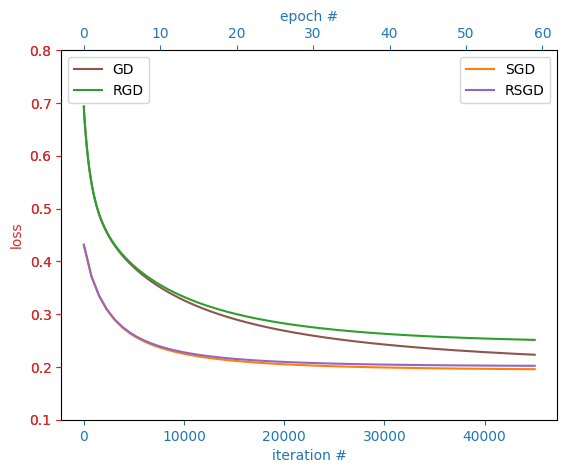

In [36]:
fig = plt.figure()
ax_gd = fig.add_subplot(111, label="GD")
ax_sgd = fig.add_subplot(111, label="SGD", frame_on=False)

ax_gd.plot(range(len(non_reg_gd_losses)), non_reg_gd_losses, color="C5", label="GD")
ax_gd.plot(range(len(reg_gd_losses)), reg_gd_losses, color="C2", label="RGD")
ax_gd.set_ylim(0.1, 0.8)
ax_gd.set_xlabel("iteration #", color="C0")
ax_gd.set_ylabel("loss", color="C3")
ax_gd.tick_params(axis='x', colors="C0")
ax_gd.tick_params(axis='y', colors="C3")

ax_sgd.plot(range(len(non_reg_sgd_losses)), non_reg_sgd_losses, color="C1", label="SGD")
ax_sgd.plot(range(len(reg_sgd_losses)), reg_sgd_losses, color="C4", label="RSGD")
ax_sgd.set_ylim(0.1, 0.8)
ax_sgd.xaxis.tick_top()
ax_sgd.tick_params(axis='x', colors="C0")
ax_sgd.tick_params(axis='y', colors="C3")
ax_sgd.xaxis.set_label_position('top') 
ax_sgd.set_xlabel('epoch #', color="C0")

ax_gd.legend(loc="upper left")
ax_sgd.legend(loc="upper right")

plt.show()